# Assignment 4: Static Portfolio - Part 2 (Theming & Geospatial Vis)

**Author: Luis Eduardo San Martin**

My purpose with this assignment is to use the `altair` visualization library to explore the inequalities of Lima, the capital of Peru. I will build on what I had already submitted for the first part of this assignment. Each graphic presented seeks to represent a particular topic/dimension where the inequality of Lima is reflected.

## Comments on my data preparation

All my data preparation was conducted on the notebooks in [this folder](https://github.com/luisesanmartin/data-vis-public-policy-course/tree/master/notebooks/cleaning). The raw data I used is stored [here](https://github.com/luisesanmartin/data-vis-public-policy-course/tree/master/data/raw). This raw data comes from these sources:

* **GIS data of the districts of Peru:** Generated and published by INEI, the National Institute of Statistics of Peru. It was published along with the results of the Poverty Map 2013. It is available for download in [this link](http://iinei.inei.gob.pe/iinei/srienaho/descarga/DocumentosZIP/2013-129/Informacioncartografica.zip), which leads to a zip file containing the shapefiles of the three levels of administrative divisions of Peru (districts is the third one) and some of the blocks in Lima Metropolitana.

* **GIS data of the block groups of Lima Metropolitana:** Generated and published by INEI after the 2007 National Census. It contains the GIS data of the block groups of Lima Metropolitana. This data file is not publicly available online, and can only be accessed through a formal request of public information to INEI. The file I use from this dataset can be accessed [here](https://github.com/luisesanmartin/data-vis-public-policy-course/tree/master/data/raw/GIS/INEI%20zones). It was generated by me from the raw file provided by INEI with the software QGIS. The file contains the geometries of the block groups in Lima Metropolitana.

* **Data from the National Households Survey (ENAHO):** Also collected by INEI. Specifically, I used the 2018 datasets of the health, labor, dwelling and summary modules; along with the 2014-2017 datasets of the dwelling and summary modules. This data can be downloaded from the [INEI microdata repository](http://iinei.inei.gob.pe/microdatos/).

* **District population data from the 2017 National Census:** Inexplicably, INEI has not yet published the microdata of the last National Census conducted in Peru. Instead, only some ad-hoc data queries of aggregated results are available in this [old-fashioned site](http://censos2017.inei.gob.pe/redatam/). From it, I generated queries to download the districts population for Lima and Callao, the two departments in the Lima Metropolitana area.

* **Average results by school of 2016 National Students Evaluation:** This is data generated by the Ministry of Education of Peru, and it is available only through formal requests of access to information conducted in-person. I gained access to it through a request I did in 2018. The raw file I received for my request is available [here](https://github.com/luisesanmartin/data-vis-public-policy-course/blob/master/data/raw/IE%202P%20ECE%2016_Lima.xlsx). Publishing it does not violate any law of the Peruvian public data protection regulation, since it does not contain any personally identifiable information.

Using data from several sources required extensive data wrangling and standardization, conducted in the `pandas` and `geopandas` libraries. Any curious reader is invited to visit the [data cleaning part of my personal repository of the course](https://github.com/luisesanmartin/data-vis-public-policy-course/tree/master/notebooks/cleaning) to review it.

## Importing the libraries

I will use `pandas` and `geopandas` for reading and manipulating my data, and of `altair` and `seaborn` to produce my visualizations. I will also use `matplotlib.pyplot` to customize the `seaborn` visualizations.

In [1]:
import altair as alt
alt.renderers.enable('html')
import seaborn as sns
import matplotlib.pyplot as plt, mpld3
import geopandas as gpd
import pandas as pd

I will also set two paths to read my data from.

In [2]:
path = '../../data/clean/'
path_raw = '../../data/raw/'
outputs = '../../outputs/'

## Theme selection

My theme selection relied on the instructions presented [here](https://towardsdatascience.com/consistently-beautiful-visualizations-with-altair-themes-c7f9f889602). In general, I sought to use a somewhat minimalist style with soft colors for the plots and black for the text, in a soft gray background.

In [3]:
def my_theme1():

    font = "Open Sans"
    axisColor = "#000000"
    textColor = "#000000"
    gridColor = "#e5e5e5"
    backgroundColor = "#e5e5e5"
    
    return {
        "config": {
            "background": backgroundColor
            ,
            "title": {
                "fontSize": 22,
                "font": font,
                "anchor": "start",
                "fontColor": textColor
            },
            "axisX": {
                "domain": True,
                "grid": True,
                "labelFont": font,
                "labelFontSize": 11,
                "labelAngle": 0, 
                "ticks": True,
                "titleFont": font,
                "titleFontSize": 13,
            },
            "axisY": {
                "domain": True,
                "grid": True,
                "labelFont": font,
                "labelFontSize": 11,
                "labelAngle": 0, 
                "ticks": True,
                "titleFont": font,
                "titleFontSize": 13,
                "titleAngle": 0,
                "titleY": -10,
                "titleX": 18
            },
            "text": {
               "font": font,
               "color": textColor,
               "fontSize": 14,
               "align": "center",
               "fontWeight": "bold",
           },
            "legend": {
                "labelFont": font,
                "labelFontSize": 11,
                "titleFont": font,
                "titleFontSize": 12,
            },
            "geoshape": {
                "stroke": "white"
            },
            "view": {
                "stroke": backgroundColor
            }
        }
    }

In [4]:
alt.themes.register('my_theme1', my_theme1)
alt.themes.enable('my_theme1')

ThemeRegistry.enable('my_theme1')

## 1 - Introducing my classification of Lima

My first plot serves the purpose of introducing the unfamiliar reader with the city of Lima.

With more than 10 million people and a regulation that forbids the construction of skyscrappers due to the risk of earthquakes, Lima is huge in inhabitants and gigantic in extension. Bounded between the South Pacific Ocean to the West and the beginning of the Andes mountains to the East, it has a weird shape.

This first plot consists of a map of the city of Lima using an aggregation of districts (the administrative division of Lima Metropolitana) into eight distinct groups defined by me. Though this grouping is ultimately arbitrary, it tries to follow a criteria of geographic proximity and road accessibility intra group. This is my classification of the city:

* North Lima
* South Lima
* East Lima
* Old town
* The port
* High income Lima
* San Juan de Lurigancho
* South beach

From now on, these areas will be called zones.

Additionally, I will also include in this plot the polygon lines of the block groups of the city. With this, the viewer can have a better idea of how the population of each zone is spatially distributed.

### And now, the code

I will continue now by importing my cleaned data

In [5]:
zones_file = 'zones_lima.geojson'
lima_zones = gpd.read_file(path + zones_file)

In [6]:
block_groups_file = 'GIS/INEI zones/zonas_lima_metropolitana.shp'
lima_block_groups = gpd.read_file(path_raw + block_groups_file)

`lima_zones` consists of a geographic dataframe where each row is a zone. It contains the GIS data of each zone and its total population. This dataframe was created with district population data from the 2017 National Census and with GIS data of the districts of Peru produced for the 2013 Poverty Map, both published by INEI. The data preparation for this dataframe can be [reviewed here](https://github.com/luisesanmartin/data-vis-public-policy-course/blob/master/notebooks/cleaning/1_grouping%20districts%20of%20lima.ipynb).

`lima_block_groups` is a shapefile I created specifically for this visualization. Each row is a block group and it contains the GIS data of each block group in Lima Metropolitana, according to the classification made by INEI after the 2007 census. The original raw data file from which it was generated was a `gdb` file containing layers for every block and block group in Peru, and it can only be accessed through a formal request of public information to INEI. `lima_block_groups` was created by separating only the block groups layer from the raw `gdb` file and filtering the block groups corresponding to Lima Metropolitana. I conducted this process in QGIS, a point and click GIS analysis software, and that is why I did not upload the code to produce to the repository I am using.

Now I will generate two columns with the latitude and longitude of the centroids of each zone.

In [7]:
lima_zones['centroid_lat'] = lima_zones['geometry'].centroid.y
lima_zones['centroid_lon'] = lima_zones['geometry'].centroid.x

Also, I need to project the geographic coordinates of `lima_block_groups` to lat/lon format so they can be displayed in the same graph with the zones.

In [8]:
lima_block_groups = lima_block_groups.to_crs(epsg=4326)

One last thing before we plot: I will replace the name of the zone "San Juan de Lurigancho" with "SJL". I do this because the name "San Juan de Lurigancho" is too long for my plot.

In [9]:
lima_zones2 = lima_zones.replace('San Juan de Lurigancho', 'SJL')
lima_zones2['population_thousands'] = lima_zones2['population'] / 1000

Now, we plot. I used [this example](https://altair-viz.github.io/gallery/london_tube.html) as a reference for producing this code.

In [10]:
background = alt.Chart(lima_zones2).mark_geoshape(
    strokeWidth=2,
).encode(
    alt.Color('population_thousands:Q',
              type='quantitative',
              scale=alt.Scale(scheme='Blues'),
              title='Population (thousands)')
).properties(
    width=600,
    height=700,
    title={'text': 'This is Lima',
           'subtitle': ['A plot of the city population in 2017, divided by zones ' +
                        'and showing every block group.',
                        'Data sources: 2017 National Census and 2013 Poverty Map.']}
)
labels = alt.Chart(lima_zones2).mark_text().encode(
    latitude='centroid_lat',
    longitude='centroid_lon',
    text='zone'
)
block_groups = alt.Chart(lima_block_groups).mark_geoshape(
    strokeWidth=.3,
    fill=None
)

plot1 = background + block_groups + labels
plot1.save(outputs + '1-zones_population.json')
plot1

alt.LayerChart(...)

With the clear exception of South Beach, every zone in this classification has a population of at least one million people, approximately. North Lima is the zone with the most population, with more than 2 million. The distribution of the block groups shows that most of the zones have areas with zero population, like the north of North Lima, the east of South Lima or almost every part but the coast of South beach. Additionally, the block groups signal road connectivity between different parts of the city. Noticeably, some zones suffer from lack of road connectivity between them in spite of being geographically close, like the central part of North Lima and the north of San Juan de Lurigancho.

## 2 - Type of access to water by zone

I chose this as one of my chosen indicators to show the inequities of Lima because extending the network of piped water in the city poses a series of tremendous challenges for its great geographic extension, topographic variation,  scarce availability of natural water resources and the corruption of the water provider, among others.

### My code

I will start by importing my data. Each row in this data table is a unique combination of year and zone. The preparation of this dataframe is available [here](https://github.com/luisesanmartin/data-vis-public-policy-course/blob/master/notebooks/cleaning/3_arranging%20the%20ENAHO%20data_access%20to%20water.ipynb). The raw data I used comes from the dwelling and summary modules of the National Household Survey data for the years 2014-2018, published by INEI.

In [11]:
water_file = 'access to water by zones_2014-2018.csv'
access_to_water = pd.read_csv(path + water_file)

The columns in the `access_to_water` dataframe are the proportions of population in a year and zone who access water in a particular way. These are the categories:

1. Piped water inside the house
2. Piped water outside the house, inside the property
3. Tanker truck
4. Public water reservoir
5. Water well
6. River or water stream
7. Other water source

The careful reader will notice that the order of these categories is not random. They are sorted by quality of the mean to access water, from higher to lower.

Right now, the dataset is in wide format with respect to the type of access to water. For this visualization, I will first have to transform it from wide to long format. To do this, I will add a name stub to all the access to water columns I have.

In [12]:
stub = 'access to water'
columns = ['1-piped water inside the house',
           '2-piped water in the property',
           '3-tanker truck/public reservoir',
           '4-water well, river or other']
for col in columns:
    access_to_water = access_to_water.rename(columns = {col: stub + '-' + col})

Now I will reshape the data from wide to long

In [13]:
access_to_water2 = pd.wide_to_long(access_to_water,
                                   stubnames=stub,
                                   i=['year', 'zone'],
                                   j='type of access',
                                   sep='-',
                                   suffix='([\w\s\d,/]|-)+').reset_index()

After this, each observation is a unique combination of `year`, `zone` and `type of access`. This is exactly what I need for my plot.

Now I will create my visualization. I used [this example](https://altair-viz.github.io/gallery/stacked_bar_chart.html) as the reference for my code.

In [14]:
plot2 = alt.Chart(access_to_water2[access_to_water2['year'] == 2018]).mark_bar().encode(
    alt.Y('zone', sort=['High income Lima',
                        'Port',
                        'South Lima',
                        'Old town',
                        'North Lima',
                        'East Lima',
                        'San Juan de Lurigancho',
                        'South beach'],
          axis=alt.Axis(title='Zone')),
    alt.X('access to water',
          scale=alt.Scale(domain=(0, 100)),
          axis=alt.Axis(title='Access to water (% of population)')),
    alt.Color('type of access',
              type='ordinal',
              scale=alt.Scale(
                  domain=columns,
                  range=['#3182bd',
                         '#9ecae1',
                         '#fc9272',
                         '#de2d26']),
              title='Access'),
    order=alt.Order('type of access',
                    sort='ascending')
).properties(
    width = 650,
    title={'text': 'The types of access to water in Lima',
           'subtitle': ['Type of access to water in Lima in 2018, by zone. ' +
                        'The order of the type of access reflects a quality hierarchy',
                        'Data source: 2018 National Household Survey']}
)

plot2.save(outputs + '2-zones_access_to_water_2018.json')
plot2

alt.Chart(...)

Except for Sout Beach, there is not a stark contrast between each zone in the proportion of population with access to piped water inside the house. High Income Lima reaches a proportion of more than 0.95, buth the Port, South Lima and the Old Town are also above 0.9. South Beach is clearly an outlier in this, and a reason for that might be the expansion of and seasonal, unfinished middle-class beach houses and informal settlements in this area of the city. In general, there is not a big inequality in this indicator among different zones of Lima.

## 3 Evolution of the access to piped water inside the house

I will continue by exploring the evolution of the access to piped water inside the house, the highest quality type of access to water. I will keep using the `access to water` dataframe, where every observation is a combination of `year` and `zone`, and the proportion of population that has a certain type of access to water is conveniently stored in separated columns.

First, I will remove the name stub in my variable of interest.

In [15]:
rename = {'access to water-1-piped water inside the house': 'piped water inside the house'}
access_to_water = access_to_water.rename(columns=rename)

Now I can produce my graph. I will leave the zone "South beach" out of this visualization because  it is clearly an outlier in this variable. The code for this graph was based on the examples presented in the class lectures.

In [16]:
plot3 = alt.Chart(access_to_water[access_to_water['zone']!='South beach']).mark_line().encode(
    alt.X('year:N',
          axis=alt.Axis(title='Year')),
    alt.Y('piped water inside the house',
          scale=alt.Scale(domain=(80, 100)),
          axis=alt.Axis(title='Piped water inside the house (% of population)')),
    color = 'zone'
).properties(
    width = 590,
    title={'text': 'Evolution of the access to piped water in Lima',
           'subtitle': ['Proportion of population with access to piped ' + 
                        'water inside the house by zone, 2014-2018',
                        'Data sources: 2014-2018 National Household Survey']}
)

plot3.save(outputs + '3-trends_access_to_water_2014-2018.json')
plot3

alt.Chart(...)

The last five years of available data do not show a clear trend in the increase of access to piped water by zone Lima, though in the last year (2018) all areas increased it. Also importantly, this visualization does not bring evidence of a clear diverging trend by zone that could exacerbate existing inequalities (with the slight exception of South Beach, not included in this graph). All things considered, it seems that access to water is not highly unequal among these zones in Lima.

## 4 - Distribution by zones of the access to formal jobs

Leaving access to water behind, now I will analyze the access to formal jobs. Specifically, I will compare how the whole population of Lima is distributed by zone with how the whole population of *people with formal jobs* is distributed by zone.

The Peruvian government does not have a precise definition of formal jobs, and most approaches usually rely on if a worker is affiliated to a retirement fund and on if she has some kind of health provision plan. Specifically, my definition of formal job is the following:

* The worker is affiliated to a retirement plan.
* The worker is affiliated to at least one these types of health provision: the general health provider for workers, a private health provider, or the police/military health provider.

The data wranging part for the dataframe I will use for this visualization is [here](https://github.com/luisesanmartin/data-vis-public-policy-course/blob/master/notebooks/cleaning/4_arranging%20the%20ENAHO%20data_formal%20jobs.ipynb). The raw data comes from the health, labor and summary modules of the 2018 National Household Survey, collected and published by INEI.

Opening the data file:

In [17]:
formal_jobs_file = 'percentage formal jobs by zone_lima_2018.csv'
formal_jobs = pd.read_csv(path + formal_jobs_file)

The dataframe `formal_jobs` contains only one row: the year 2018. It has columns with the proportion of population from the different zones of Lima, among the whole population in the city with formal jobs. In other words, this small dataframe is wide with respect to `zone`. Given that I need it in long format, I will first add a stub name to every zone variable and then reshape it.

In [18]:
stub = 'number of people'
group = ['N Working age',
         'N Employed',
         'N Formal job']
for col in group:
         formal_jobs = formal_jobs.rename(columns={col: col[2:]})
group = ['Working age',
         'Employed',
         'Formal job']
for col in group:
         formal_jobs = formal_jobs.rename(columns={col: stub + '-' + col})

Reshaping the dataframe to long format:

In [19]:
formal_jobs = formal_jobs[['year', 'zone', stub + '-Working age', stub + '-Employed', stub + '-Formal job']]
formal_jobs2 = pd.wide_to_long(formal_jobs,
                               stubnames=stub,
                               i=['year', 'zone'],
                               j='indicator',
                               sep='-',
                               suffix='[\w\s]+').reset_index()

This result has the proportion of population with formal jobs by zone, but I still do not have the proportion of all the population by zone. Then, I will bring the `population` column from the `lima_zones` dataframe, which I used for my first visualization.

In [20]:
formal_jobs2 = pd.merge(formal_jobs2, lima_zones[['zone', 'population']], how='inner', on='zone')
formal_jobs2 = formal_jobs2[formal_jobs2['zone'] != 'South beach']

Finally, we can plot. This plot will compare the proportion of people by zone and the proportion of people with formal jobs by zone, in two parallel normalized stacked bars. Please notice that I am leaving out the area "South beach" because its share of the population is so low that it could not be visualized in the graphic along with the other zones.

The code for producing this graph was referenced on the examples presented in the lectures.

In [21]:
plot4 = alt.Chart(formal_jobs2).mark_area().encode(
    alt.X('zone:N',
          axis=alt.Axis(title='Zone')),
    alt.Y("number of people:Q",
          stack=None,
          axis=alt.Axis(title='Number of people')),
    color=alt.Color("indicator:N",
                    title='Groups',
                  sort=['Working age',
                        'Employed',
                        'Formal job'])
).properties(
    width = 750,
    title={'text': 'Distribution of formal jobs in Lima',
           'subtitle': ['Comparing the working age population, population ' +
                        'with jobs and population with formal jobs by zone, in 2018',
                        'Data sources: 2017 National Census and ' +
                        '2018 National Household Survey']}
)

plot4.save(outputs + '4-zones_formal_jobs_2018.json')
plot4

alt.Chart(...)

Except for Old Town and North Lima, the graph does not show salient differences betwen the proportion of population considered in both indicators. More importantly, it is noticeable that the proportion of population from High Income Lima is lower among the population with formal jobs than among the whole population. This is a completely unexpected result, and possibly an indicator that my classification of High Income Lima is not as high income as I thought, or that my criteria for formal jobs (which I expected to be correlated with wealth) needs to be more strict.

## 5 - Distribution of the quality of public primary schools by area

The next inequality I will explore is the quality of public primary schools by zone. To show this, I will use the results of the last National Evaluation of Students as a proxy for school quality. Though I initially used a Stripplot for this, I finally decided to present a Swarmplot along with a Violin plot to show the distribution by zone of the average result by school of the National Students Evaluation for the second year of primary, for all public schools in Lima. The National Students Evaluation was a standardized test conducted by the Ministry of Education of Peru to track the progress of the students' learnings year by year. It was discontinued after 2016 and replaced by a sampled evaluation instead of a nationwide one.

The dataframe `schools` was prepared in [this notebook](https://github.com/luisesanmartin/data-vis-public-policy-course/blob/master/notebooks/cleaning/2_cleaning%20IE%202P%20ECE%2016_Lima.ipynb). As mentioned before, its raw data comes from a request of access to public information I conducted in-person with the Ministry of Education of Peru. Every row in the dataframe is a public primary school in Lima Metropolitana, and the list is complete. The columns contain the average result in math for second grade of primary, the zone where the school is, and some additional school identificators (name, school ID and others).

Reading the data:

In [22]:
schools_file = 'ECE_by_school_2p_lima_2016.csv'
schools = pd.read_csv(path + schools_file)

This data allows to produce the graph directly. I relied heavily on this [Swarmplot example](https://seaborn.pydata.org/generated/seaborn.swarmplot.html) and on this [title and subtitle manipulation question](https://stackoverflow.com/questions/52914441/seaborn-title-and-subtitle-placement) to generate this code. I also relied and several other answers from users in Stack Overflow to customize this visualization in order to make it look like the theme of my `altair` plots. Nonetheless, I could not find a way to apply my font selection (Open Sans) on it, and it remained with the default DejaVu Sans.

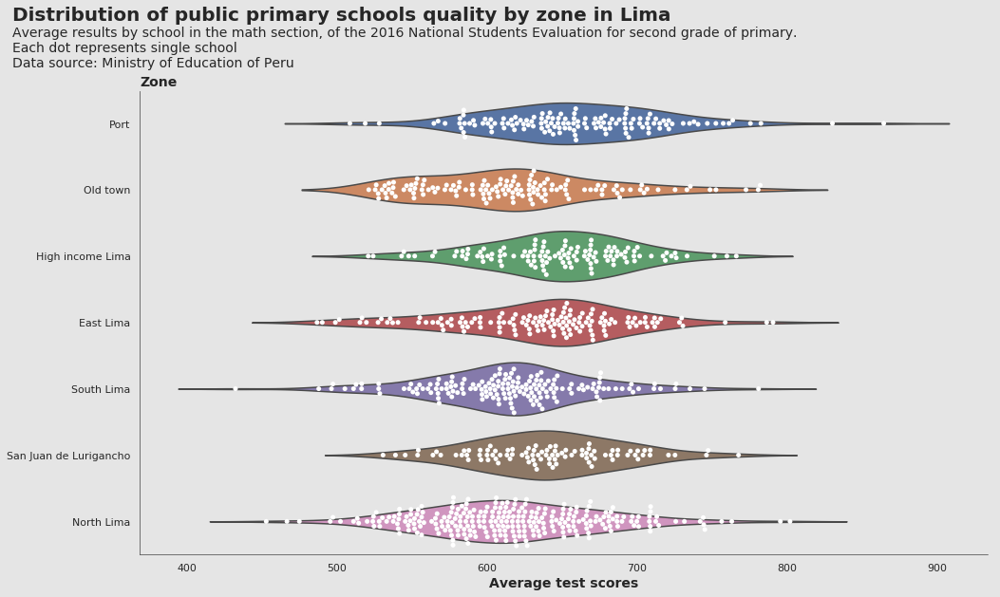

In [23]:
sns.set(rc={'axes.facecolor':'#e5e5e5',
            'figure.facecolor':'#e5e5e5'})
plot5 = plt.figure(figsize=(16, 9))
ax = sns.violinplot(y="zone",
                    x="average_score",
                    data=schools[schools['zone']!='South beach'],
                    inner=None)
ax = sns.swarmplot(y="zone",
                   x="average_score",
                   data=schools[schools['zone']!='South beach'],
                   color="white",
                   edgecolor="gray")
plot5.text(x=-0.15, y=1.15,
         s='Distribution of public primary schools quality by zone in Lima',
         weight='bold',
         fontsize=20,
         ha='left',
         transform=ax.transAxes)
plot5.text(x=-0.15, y=1.05,
         s='Average results by school in the math section, of the 2016 ' +
           'National Students Evaluation for second grade of primary.\n' +
           'Each dot represents single school\n' +
           'Data source: Ministry of Education of Peru',
         fontsize=14,
         #fontname='Open Sans',
         ha='left',
         transform=ax.transAxes)
plot5.text(x=0, y=1.01,
         s='Zone',
         weight='bold',
         fontsize=14,
         ha='left',
         transform=ax.transAxes)
ax.set_xlabel(xlabel='Average test scores',
              weight='bold',
              fontsize=14)
ax.set_ylabel(ylabel='')
ax.spines['left'].set_color('#000000')
ax.spines['left'].set_linewidth(0.5)
ax.spines['bottom'].set_color('#000000')
ax.spines['bottom'].set_linewidth(0.5)
ax.spines['right'].set_color('#e5e5e5')
ax.spines['top'].set_color('#e5e5e5')
ax.grid(False)

plot5.axes.append(ax)
plot5.savefig(outputs + "5-zones_public_primary_quality.png")

The graph shows that the number of public schools in South Beach is very low, and that North Lima has a higher number of public schools than all the other zones. Regarding the distribution of results, the plot shows that the Port has the highest median of average test scores, followed by the High Income and East zones. Apart from having the higher number of public primary schools, North Lima also displays the highest average score variability within zone.

## 6 - Dwellings in bad condition by district

My last two plots will be two geospatial visualizations at the district level, while also showing the zones division I have been using for Lima Metropolitana. The data for these visualizations come from the National Households Survey (ENAHO). As ENAHO data for one year does not have a sufficient number of observations to conduct inference at the district level, I will pool the data for the years 2016-2018 to have a sufficient number of observations for estimating district-level indicators. Thus, the plots I will show will correspond to district averages for the period 2016-2018. Additionally, these plots will exclude the South Beach zone because the number of observations for the districts in this zone is not enough for producing reliable indicators, not even after pooling the ENAHO data in the three years.

The first of these plots shows the rate of households with a dwelling in bad condition by district. I have defined bad dwelling condition as a dwelling that has at least one of these characteristics:

* The walls of the dwelling are made from scrapped materials.
* The dwelling has dirt floor.
* The access to water of the dwelling is through a water truck or a mean of less quality.
* The dwelling does not have a connection to the sewage network.
* The dwelling has a ratio between number of household members and number of rooms equal to 3 or more.

It is worth to note that INEI's definition of inadequate dwelling takes into account having any of the first two characteristics mentioned. My proposed definition of dwelling in bad condition expands this notion by also take into account adequate access to water and sanitation, and if the dwelling is overcrowded.

### Districts data

I will start by importing the district data.

In [24]:
districts_file = path_raw + 'GIS/03 Limite Distrital Abril 2015/DISTRITO_27_04_2015.shp'
districts = gpd.read_file(districts_file)

The geodataframe `districts` contains all the districts of Peru, including their geospatial data. The shapefile where it comes from was extracted from a [publicly available](http://iinei.inei.gob.pe/iinei/srienaho/descarga/DocumentosZIP/2013-129/Informacioncartografica.zip) zip file published by INEI along with the results of the poverty map 2013.

Filtering in the districts in Lima Metropolitana:

In [25]:
districts_lima = districts[(districts['IDPROV'] == '1501') | (districts['IDDPTO'] == '07')].reset_index()

### Dwelling data

Reading data:

In [26]:
dwelling_file = path + 'bad dwelling by district_2016-2018 average.csv'
dwelling = pd.read_csv(dwelling_file)

The `dwelling` dataframe contains the 2016-2018 average rate of dwellings in bad condition by district. The data preparation for `dwelling_file` was conducted [here](https://github.com/luisesanmartin/data-vis-public-policy-course/blob/master/notebooks/cleaning/7_arranging%20the%20ENAHO_dwelling%20in%20bad%20conditions.ipynb). The raw data for this dataframe comes from the dwelling modules of the ENAHO data for the years 2016-2018.

Now I will merge the dwelling data with the districts data.

In [27]:
districts_lima['IDDIST'] = districts_lima['IDDIST'].astype('int32')
districts_lima = pd.merge(districts_lima, dwelling, how='inner', on='IDDIST')

Lastly, we filter out South Beach from the zones and the districts in South Beach from the districts.

In [28]:
lima_zones3 = lima_zones2[lima_zones2['zone'] != 'South beach']

In [29]:
lima_block_groups2 = lima_block_groups[(lima_block_groups['UBIGEO'] != '150124') & \
                                       (lima_block_groups['UBIGEO'] != '150129') & \
                                       (lima_block_groups['UBIGEO'] != '150126') & \
                                       (lima_block_groups['UBIGEO'] != '150127') & \
                                       (lima_block_groups['UBIGEO'] != '150138')]

In [30]:
districts_lima2 = districts_lima[(districts_lima['IDDIST'] != 150124) & \
                                 (districts_lima['IDDIST'] != 150129) & \
                                 (districts_lima['IDDIST'] != 150126) & \
                                 (districts_lima['IDDIST'] != 150127) & \
                                 (districts_lima['IDDIST'] != 150138)]

The plot:

In [31]:
background = alt.Chart(districts_lima2).mark_geoshape(
    strokeWidth=0.5,
).encode(
    alt.Color('bad dwelling rate',
              type='quantitative',
              scale=alt.Scale(scheme='Reds'),
              title='Rate (%)')
).properties(
    width=600,
    height=600,
    title={'text': 'Dwellings in bad condition in Lima',
           'subtitle': ['The graph shows the 2016-2018 average rate of dwellings in bad condition ' +
                        'by district.',
                        'The smallest geographic units shown are districts, ' +
                        'and the units with white boundaries and name tags are zones.',
                        'Data source: 2016-2018 National Households Survey.']}
)
labels = alt.Chart(lima_zones3).mark_text().encode(
    latitude='centroid_lat',
    longitude='centroid_lon',
    text='zone'
)
lines = alt.Chart(lima_zones3).mark_geoshape(
    strokeWidth=2,
    fill=None
)
plot6 = background + lines + labels
plot6.save(outputs + '6-districts_dwellings_in_bad_condition_2018.json')
plot6

alt.LayerChart(...)

The map shows a correspondence between districts in High Income Lima and lower rates of dwellings in bad condition. Additionally, it is also salient that districts outside of the High Income zone but closest to it also have a lower proportion of dewllings in bad condition. This is especially noticeable for the districts in the south side of North Lima and the Port, as well as in the east of South Lima.

## 7 - Poverty rates by district

Finally, my last visualization seeks to sum up this work by showing the final result of all the inequalities previously shown with a map of the poverty rates by districts in Lima.

First, I will import and merge the poverty data.

In [32]:
poverty_file = path + 'poverty by district_2016-2018 average.csv'
poverty = pd.read_csv(poverty_file)

In [33]:
districts_lima2 = pd.merge(districts_lima2, poverty, how='left', on='IDDIST')

Now we can plot:

In [34]:
background = alt.Chart(districts_lima2).mark_geoshape(
    strokeWidth=0.5
).encode(
    alt.Color('poverty rate',
              type='quantitative',
              scale=alt.Scale(scheme='Reds'),
              title='Poverty rate (%)')
).properties(
    width=600,
    height=600,
    title={'text': 'Poverty rate in Lima',
           'subtitle': ['Map of the 2016-2018 average poverty rates by district.',
                        'The smallest geographic units shown are districts, ' +
                        'and the units with white boundaries and name tags are zones.',
                        'Data source: 2016-2018 National Households Survey.']}
)
labels = alt.Chart(lima_zones3).mark_text().encode(
    latitude='centroid_lat',
    longitude='centroid_lon',
    text='zone'
)
lines = alt.Chart(lima_zones3).mark_geoshape(
    strokeWidth=2,
    fill=None
)
plot7 = background + lines + labels
plot7.save(outputs + '7-districts_poverty_rates_2018.json')
plot7

alt.LayerChart(...)

The map  shows a correlation between being part of the High Income zone and having lower poverty rates. Also noticeably is the clustering of districts with lower poverty rates in the areas close to the north boundary of High Income Lima, in the South of the Port and North Lima, and the east of Old Town. The geospatial patterns shown in the dwellings in bad condition plot are very close to the ones resembled in this map.

## 8 - Poverty rates by absolute numbers

In [35]:
districts_lima2['centroid_lat'] = districts_lima2['geometry'].centroid.y
districts_lima2['centroid_lon'] = districts_lima2['geometry'].centroid.x

In [36]:
districts_lima2['absolute poverty'].max()

168064.0

In [37]:
zones = alt.Chart(lima_zones3).mark_geoshape(
    strokeWidth=2,
    fill=None
)
districts = alt.Chart(districts_lima2).mark_geoshape(
    strokeWidth=0.5,
    fill="#bdbdbd"
).properties(
    width=600,
    height=600,
    title={'text': 'Absolute poverty in Lima',
           'subtitle': ['Map of the 2016-2018 annual average number of people living in poverty by district.',
                        'The smallest geographic units shown are districts, ' +
                        'and the units with white boundaries and name tags are zones.',
                        'Data source: 2016-2018 National Households Survey.']}
)
labels = alt.Chart(lima_zones3).mark_text().encode(
    latitude='centroid_lat',
    longitude='centroid_lon',
    text='zone'
)
circles = alt.Chart(districts_lima2).mark_circle().encode(
    longitude='centroid_lon',
    latitude='centroid_lat',
    size=alt.Size('absolute poverty:Q',
                  title='People living in poverty',
                  scale=alt.Scale(range=[0,2000])),
    color=alt.value('#fb6a4a')
)

plot8 = districts + zones + circles + labels
plot8.save(outputs + '8-districts_absolute_poverty_2018.json')
plot8

alt.LayerChart(...)

## Final remarks

After finishing the two assignments on the static portfolio visualizations, I think that I have partially succeed in showing the inequalities that coexist in Lima Metropolitana. My most important conclussions regarding the methodology of this work and the information displayed by the visualizations:

* Using several data sources is a big constraint in any visualization analysis, as the data standardization takes a significant amount of time and effort
* My initial idea was that all of the indicators shown could show the stark contrast between the High Income zone and every other part of the city, which would have conveyed a strong sense of the inequality in Lima. Possibly zones grouping is too big to show the clusters of good living standards and underdevelopment that coexist in the city
* The theme customization `altair` allows for is remarkably easier to use than the one offered by `seaborn`, which is basically what `matplotlib` has. Too much hardcoding is needed in the `seaborn` case